In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from pathlib import Path
import numpy as np
import pandas as pd
from time import time
import pdb
from tqdm import tqdm, trange, tqdm_notebook
from sklearn.model_selection import KFold, StratifiedKFold, GroupKFold
import pickle as pkl
import seaborn as sns
import matplotlib.pyplot as plt
import sys, os
from collections import defaultdict, Counter

In [3]:
DATA = Path('../Data')

plt.rcParams.update({'font.size': 16})

# Load Data

In [4]:
%time df = pd.read_csv(DATA/'train.csv', dtype={'acoustic_data': np.int8, 'time_to_failure': np.float32})
df.rename(columns={'acoustic_data': 'signal', 'time_to_failure': 'ttf'}, inplace=True)

Wall time: 2min 19s


In [5]:
trans = np.where( df.ttf.values[1:] - df.ttf.values[:-1] > 0 )[0]

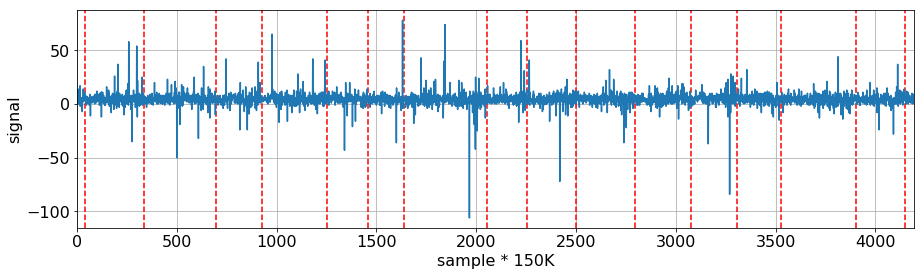

In [6]:
plt.figure(figsize=(15,4))
for t in trans:
    plt.axvline(t/150e3, linestyle='--', color='red')
plt.plot(df.signal[slice(0,len(df),150000)].values)
plt.xlim((0,len(df)/150e3))
plt.xlabel('sample * 150K')
plt.ylabel('signal')
plt.grid()

In [7]:
meta = pd.read_pickle('train.meta.covs.pickle')
n_segs = meta.shape[0]
meta.shape

(21988, 7)

Text(0,0.5,'TTF')

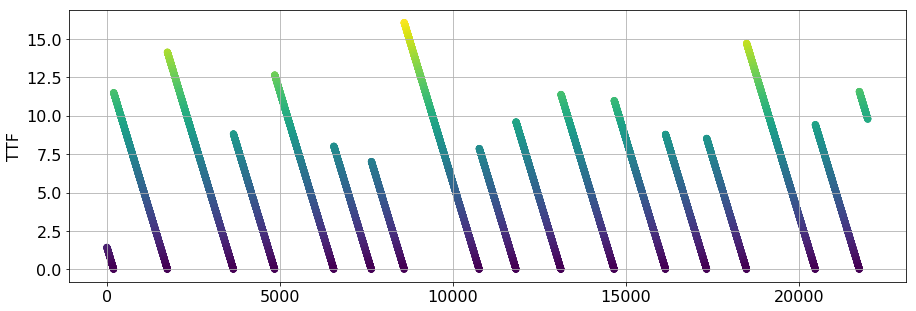

In [8]:
plt.figure(figsize=(15,5))
plt.scatter(x=np.arange(len(meta)), y=meta.qt, c=meta.qt)
plt.grid()
plt.ylabel('TTF')

In [9]:
quake_starts = np.where(np.diff(meta.qt)>0)[0] + 1
def plot_quakes(ax, full=False):
    for qs in quake_starts:
        ax.axvline(qs, linestyle='--', color='red')
    if full:
        ax.plot(meta.qt, 'r-', linewidth=1, label='True TTF')
    ax.set_xlim((0,len(meta)))
    ax.grid()

# Features

In [35]:
ff = pd.read_pickle('train.covs.pickle')
n_features = ff.shape[1]
features = ff.columns[2:-3]
ff.shape

(21988, 270)

In [36]:
print(*features, sep=',  ')

mean,  std,  abs_max,  max,  min,  abs_mean,  abs_idxmax,  q10,  q25,  q50,  q75,  q90,  q99,  q999,  q9999,  kurt,  skew,  iqr,  ave10,  ave30,  Hilbert_mean,  Hann_window_std,  dmean,  dstd,  dmax,  dq90,  dq99,  dq999,  dq9999,  drel_mean,  trend_0,  trend_1,  qt,  fft_abs_0,  fft_abs_1,  fft_abs_2,  fft_abs_3,  fft_abs_4,  fft_abs_5,  fft_abs_6,  fft_abs_7,  fft_abs_8,  fft_trend_0,  fft_trend_1,  fft_trend_2,  fft_trend_3,  fft_trend_4,  fft_trend_5,  fft_trend_6,  fft_trend_7,  fft_trend_8,  hmean,  gmean,  kstatvar_1,  kstatvar_2,  part0_max,  part0_std,  part0_mean,  part0_abs_mean,  part2_max,  part2_std,  part2_mean,  part2_abs_mean,  std_roll_std_10,  max_roll_std_10,  min_roll_std_10,  q01_roll_std_10,  q05_roll_std_10,  q95_roll_std_10,  q99_roll_std_10,  q999_roll_std_10,  q9999_roll_std_10,  av_change_abs_roll_std_10,  av_change_rate_roll_std_10,  abs_max_roll_std_10,  trend_roll_std_10,  idxmax_roll_mean_10,  std_roll_mean_10,  max_roll_mean_10,  q01_roll_mean_10,  q05_

### Feature vs. TTF

A Jupyter Widget

C:\Users\idogr\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


High abs correlation (>0.6):
              Feature  idx  |Corr|
0                  qt    0    1.00
1      num_crossing_0    1    0.66
2    num_peaks_10_100    2    0.65
3   num_peaks_10_1000    3    0.65
4         num_peaks_5    4    0.65
5    q05_roll_std_100    5    0.64
6    q01_roll_std_100    6    0.64
7   num_peaks_10_5000    7    0.64
8     q05_roll_std_10    8    0.64
9    num_ab_peaks_500    9    0.64
10       num_peaks_10   10    0.64
11    q01_roll_std_10   11    0.63
12     num_peaks_5_10   12    0.62
13          drel_mean   13    0.62
14       stalta5_mean   14    0.61
15     num_cross_0_10   15    0.61
16   num_ab_peaks_100   16    0.61
17  q05_roll_std_1000   17    0.61
18  q01_roll_std_1000   18    0.60

Low abs correlation (<0.01):
                        Feature  idx  |Corr|
0                 ewma_300_mean  229    0.01
1            q05_roll_mean_5000  230    0.01
2                   mean_change  231    0.01
3                        c3_100  232    0.01
4               

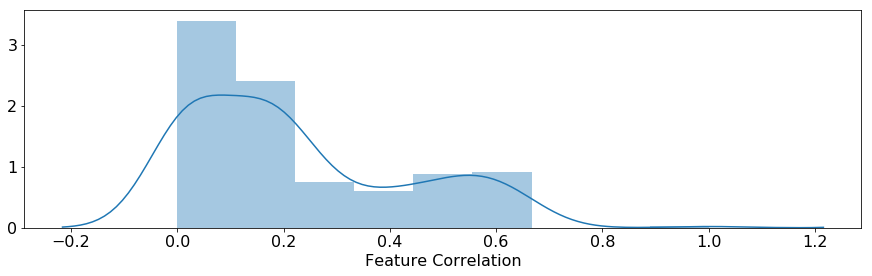

In [37]:
from collections import OrderedDict

_, axs = plt.subplots(1,1, figsize=(15,4))

cr = {}
for i,f in tqdm_notebook(enumerate(features)):
    cr[f] = np.abs(np.corrcoef(meta.qt,ff[f])[0,1])

cr = OrderedDict(sorted(cr.items(), key=lambda k: -k[1]))
f_sorted = list(cr.keys())

ax = axs
sns.distplot(list(cr.values()), ax=ax)
ax.set_xlabel('Feature Correlation')

print('High abs correlation (>0.6):')
fs = [f for f in cr if cr[f]>0.6]
tmp = pd.DataFrame({'idx':[np.where(np.array(f_sorted)==f)[0][0] for f in fs], 'Feature':fs,
                    '|Corr|':[round(cr[f],2) for f in fs]})
print(tmp)

print('\nLow abs correlation (<0.01):')
fs = [f for f in cr if cr[f]<0.01]
tmp = pd.DataFrame({'idx':[np.where(np.array(f_sorted)==f)[0][0] for f in fs], 'Feature':fs,
                    '|Corr|':[round(cr[f],2) for f in fs]})
print(tmp)

A Jupyter Widget

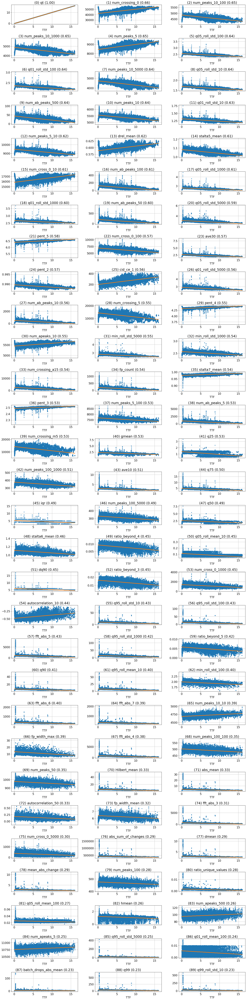

In [38]:
k = 0
_, axs = plt.subplots(30,3, figsize=(20,80))
segs = list(range(n_segs))

t0 = time()
for i,f in tqdm_notebook(enumerate(f_sorted[k*90:(k+1)*90])):
    ax = axs[i//3, i%3]
    z = np.polyfit(meta.qt, ff[f], 1)
    p = np.poly1d(z)
    ax.plot(meta.qt, ff[f], '.')
    ax.plot(meta.qt,p(meta.qt),'.', markersize=1, label='trend')
    ax.set_title(f'({i+90*k:d}) {f:s} ({cr[f]:.2f})')
    ax.set_xlabel('TTF')
    ax.grid()

plt.tight_layout()

A Jupyter Widget

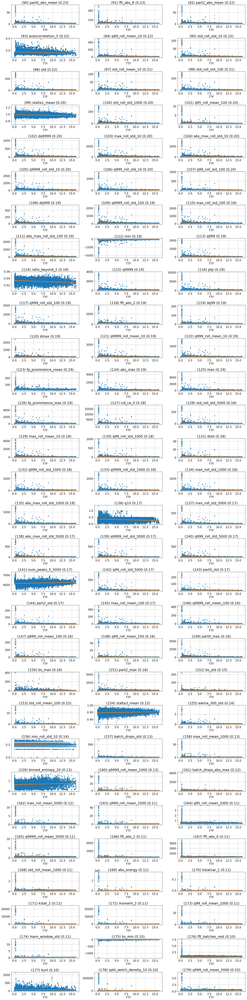

In [39]:
k = 1
_, axs = plt.subplots(30,3, figsize=(20,80))
segs = list(range(n_segs))

t0 = time()
for i,f in tqdm_notebook(enumerate(f_sorted[k*90:(k+1)*90])):
    ax = axs[i//3, i%3]
    z = np.polyfit(meta.qt, ff[f], 1)
    p = np.poly1d(z)
    ax.plot(meta.qt, ff[f], '.')
    ax.plot(meta.qt,p(meta.qt),'.', markersize=1, label='trend')
    ax.set_title(f'({i+90*k:d}) {f:s} ({cr[f]:.2f})')
    ax.set_xlabel('TTF')
    ax.grid()

plt.tight_layout()

A Jupyter Widget

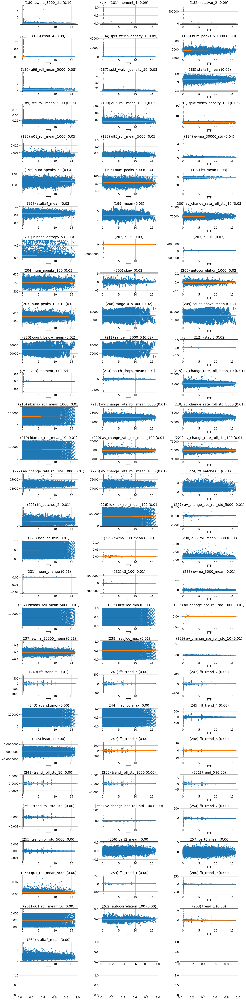

In [40]:
k = 2
_, axs = plt.subplots(30,3, figsize=(20,80))
segs = list(range(n_segs))

t0 = time()
for i,f in tqdm_notebook(enumerate(f_sorted[k*90:(k+1)*90])):
    ax = axs[i//3, i%3]
    z = np.polyfit(meta.qt, ff[f], 1)
    p = np.poly1d(z)
    ax.plot(meta.qt, ff[f], '.')
    ax.plot(meta.qt,p(meta.qt),'.', markersize=1, label='trend')
    ax.set_title(f'({i+90*k:d}) {f:s} ({cr[f]:.2f})')
    ax.set_xlabel('TTF')
    ax.grid()

plt.tight_layout()

### Trends
(in 3 groups due to limitations of pyplot)

A Jupyter Widget

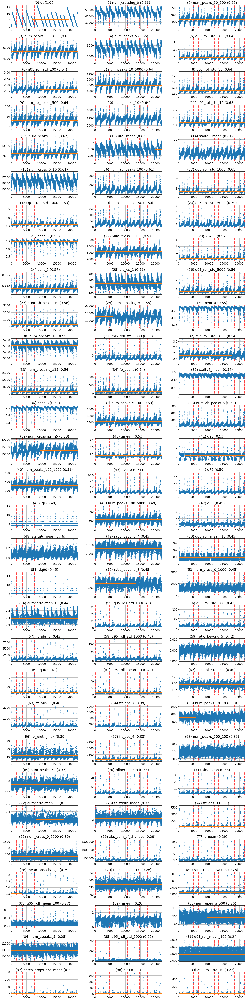

In [41]:
k = 0
_, axs = plt.subplots(30,3, figsize=(20,80))
segs = list(range(n_segs))

t0 = time()
for i,f in tqdm_notebook(enumerate(f_sorted[k*90:(k+1)*90])):
    ax = axs[i//3, i%3]
    plot_quakes(ax)
    ax.plot(ff[f], '.')
    z = np.polyfit(segs, ff[f], 1)
    p = np.poly1d(z)
    ax.plot(segs,p(segs),'.', markersize=1, label='trend') # linewidth=0.4 - not working :(
    ax.set_title(f'({i+90*k:d}) {f:s} ({cr[f]:.2f})')

plt.tight_layout()

A Jupyter Widget

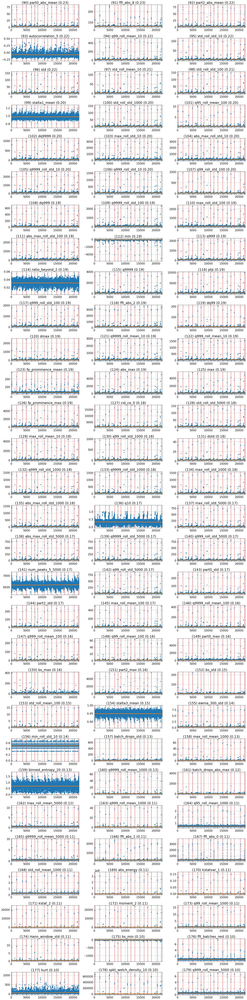

In [42]:
k = 1
_, axs = plt.subplots(30,3, figsize=(20,80))
segs = list(range(n_segs))

t0 = time()
for i,f in tqdm_notebook(enumerate(f_sorted[k*90:(k+1)*90])):
    ax = axs[i//3, i%3]
    plot_quakes(ax)
    ax.plot(ff[f], '.')
    z = np.polyfit(segs, ff[f], 1)
    p = np.poly1d(z)
    ax.plot(segs,p(segs),'.', markersize=1, label='trend') # linewidth=0.4 - not working :(
    ax.set_title(f'({i+90*k:d}) {f:s} ({cr[f]:.2f})')

plt.tight_layout()

A Jupyter Widget

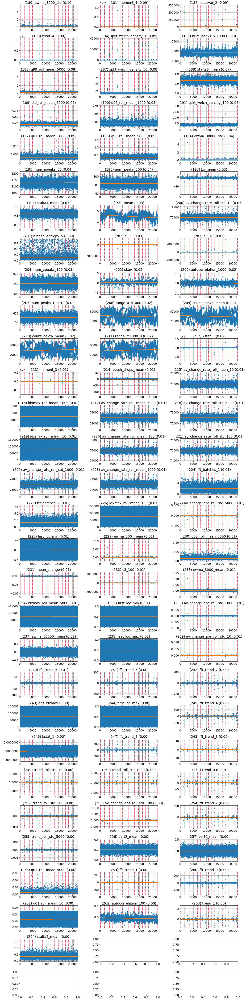

In [43]:
k = 2
_, axs = plt.subplots(30,3, figsize=(20,80))
segs = list(range(n_segs))

t0 = time()
for i,f in tqdm_notebook(enumerate(f_sorted[k*90:(k+1)*90])):
    ax = axs[i//3, i%3]
    plot_quakes(ax)
    ax.plot(ff[f], '.')
    z = np.polyfit(segs, ff[f], 1)
    p = np.poly1d(z)
    ax.plot(segs,p(segs),'.', markersize=1, label='trend') # linewidth=0.4 - not working :(
    ax.set_title(f'({i+90*k:d}) {f:s} ({cr[f]:.2f})')

plt.tight_layout()

A Jupyter Widget

C:\Users\idogr\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Negative trend (<-0.01 STDs per quake):
                Feature  Trend  idx  |Corr|
0                  mean -0.068  199    0.03
1   autocorrelation_100 -0.042  262    0.00
2    autocorrelation_50 -0.036   72    0.33
3         range_0_p1000 -0.024  208    0.02
4      count_above_mean -0.024  209    0.02
5        num_crossing_5 -0.014   28    0.55
6  autocorrelation_1000 -0.014  206    0.02
7                    qt -0.012    0    1.00

Positive trend (>0.01 STDs per quake):
            Feature  Trend  idx  |Corr|
0     num_apeaks_50  0.010  195    0.04
1   num_crossing_m5  0.015   39    0.53
2     range_m1000_0  0.024  211    0.02
3  count_below_mean  0.024  210    0.02


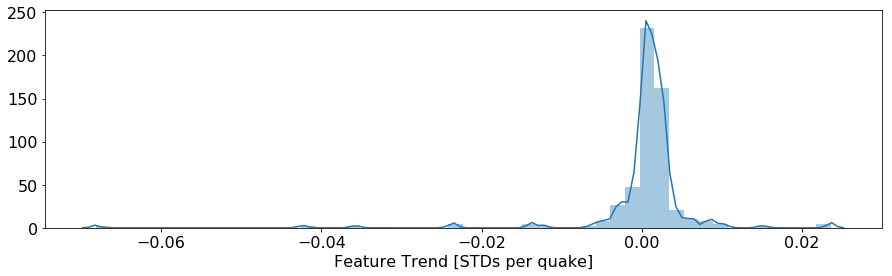

In [44]:
_, axs = plt.subplots(1,1, figsize=(15,4))

trend = {}
for i,f in tqdm_notebook(enumerate(features)):
    trend[f] = np.polyfit(segs, ff[f], 1)[0] / np.std(ff[f]) * (len(meta)/16) # trend in stds-per-quake

trend = OrderedDict(sorted(trend.items(), key=lambda k: k[1]))
ax = axs
sns.distplot(list(trend.values()), ax=ax)
ax.set_xlabel('Feature Trend [STDs per quake]')

print('Negative trend (<-0.01 STDs per quake):')
fs = [f for f in trend if trend[f]<-0.01]
tmp = pd.DataFrame({'idx':[np.where(np.array(f_sorted)==f)[0][0] for f in fs], 'Feature':fs,
                    'Trend':[round(trend[f],3) for f in fs], '|Corr|':[round(cr[f],2) for f in fs]})
print(tmp)

print('\nPositive trend (>0.01 STDs per quake):')
fs = [f for f in trend if trend[f]>0.01]
tmp = pd.DataFrame({'idx':[np.where(np.array(f_sorted)==f)[0][0] for f in fs], 'Feature':fs,
                    'Trend':[round(trend[f],3) for f in fs], '|Corr|':[round(cr[f],2) for f in fs]})
print(tmp)